# Traitement des données W43-MM1 en N2H+ 12m

In [1]:
%pylab inline
from astropy.io import fits
import aplpy
from pywavan import fbm2d, powspec, fan_trans
from scipy.optimize import curve_fit

Populating the interactive namespace from numpy and matplotlib


***
# Verification des données enregistré

In [ ]:
im_g = np.load("/user/workdir/soldanof/data/gau.npy")
im_ng = np.load("/user/workdir/soldanof/data/coh.npy")

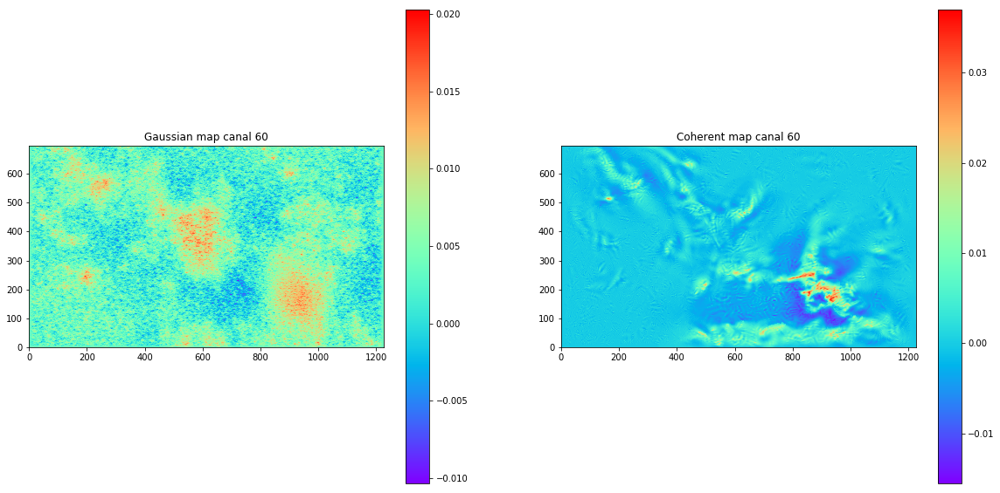

In [1390]:
figure(figsize=(20,10))

subplot(1,2,1)
imshow(im_g[60].real,origin="lower")
title('Gaussian map canal 60')
colorbar()

subplot(1,2,2)
imshow(im_ng[60].real,origin="lower")
title('Coherent map canal 60')
colorbar()


***
4 image de la partie cohérente à différente partie du cube de donnée

Text(0.5, 1.0, 'canal 130')

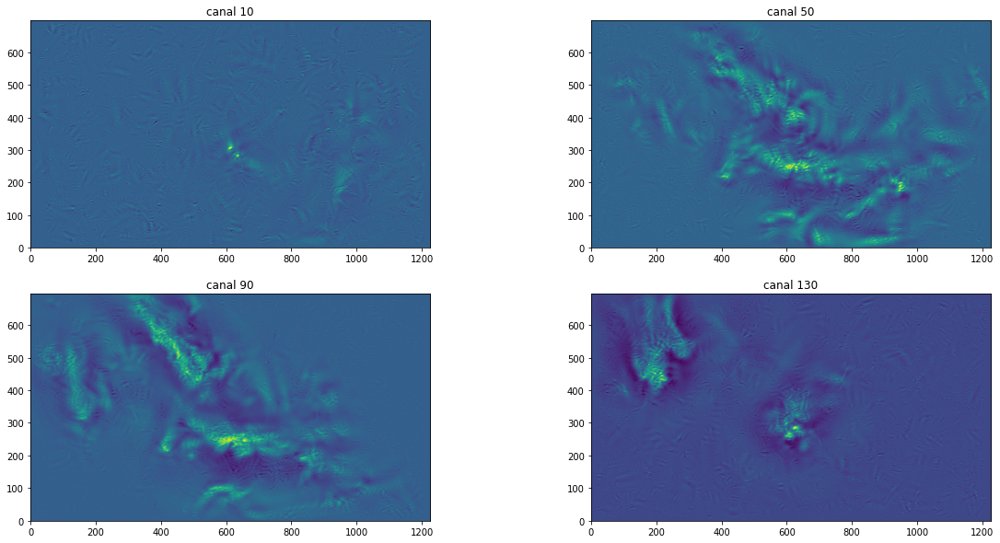

In [364]:
figure(figsize=(20,10))

subplot(2,2,1)
imshow(im_ng[10].real,origin="lower")
title('canal 10')

subplot(2,2,2)
imshow(im_ng[50].real,origin="lower")
title('canal 50')

subplot(2,2,3)
imshow(im_ng[90].real,origin="lower")
title('canal 90')

subplot(2,2,4)
imshow(im_ng[130].real,origin="lower")
title('canal 130')

Text(0.5, 1.0, 'original map canal 60')

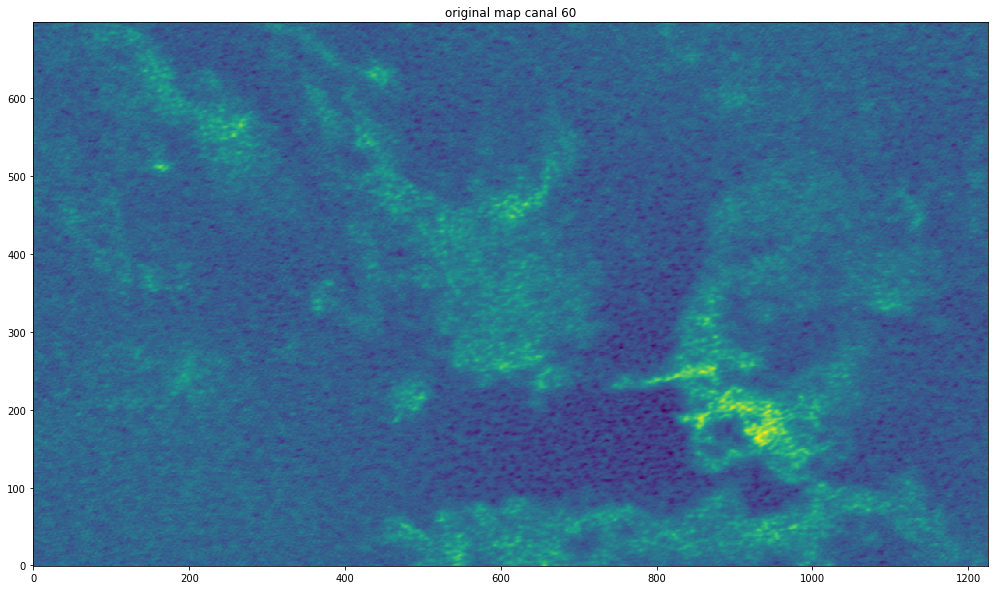

In [1461]:
figure(figsize=(20,10))
imshow(cube[60,:,:], origin="lower")
title("original map canal 60")

In [1466]:
filname = "/user/workdir/soldanof/ALMA/W43-MM1_B3_spw0_12M_n2hp.image_cut.fits"
HDU = fits.open(filname)
cube = HDU[0].data
header = HDU[0].header
del header['NAXIS3']
del header['PC3_1']
del header['PC3_2']
del header['PC1_3']
del header['PC2_3']
del header['PC3_3']
del header['CTYPE3']
del header['CRVAL3']
del header['CDELT3']
del header['CRPIX3']
del header['CUNIT3']
del header['CASAMBM']
header['NAXIS']=2

In [1467]:
fits.writeto("/user/homedir/soldanof/w43_orig60.fits",cube[60,:,:], header,overwrite= True) 

***
# Transformation des données en fichier fits

In [1083]:
HDU = fits.open("/user/workdir/soldanof/ALMA/W43-MM1_B3_spw0_12M_n2hp.image_cut.fits")
cube = HDU[0].data
header = HDU[0].header

In [41]:
fits.writeto("/user/workdir/soldanof/data/ng.fits",im_ng.real, header) 

***
# Traitement des fichier créé

Trace d'une image

INFO: Auto-setting vmin to -7.848e-03 [aplpy.core]
INFO: Auto-setting vmax to  1.404e-02 [aplpy.core]


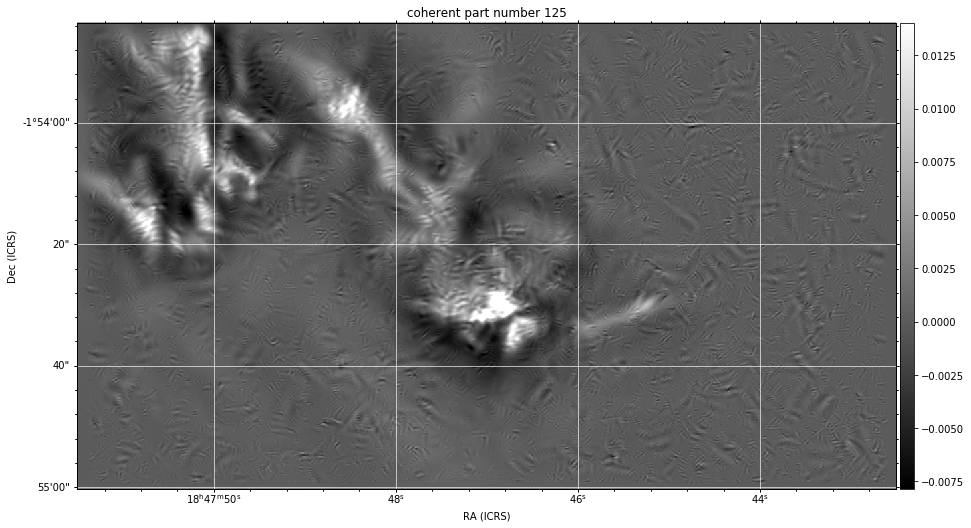

In [1081]:
fig_all = plt.figure(1, figsize=(15,15))
nbr = 125
fig = aplpy.FITSFigure("/user/workdir/soldanof/data/ng.fits",figure=fig_all,slices=[nbr])
fig.show_colorscale(cmap='gray')
fig.add_colorbar()
fig.add_grid()
fig.set_title("coherent part number {}".format(nbr))

INFO: Auto-setting vmin to -8.485e-03 [aplpy.core]
INFO: Auto-setting vmax to  1.027e-02 [aplpy.core]


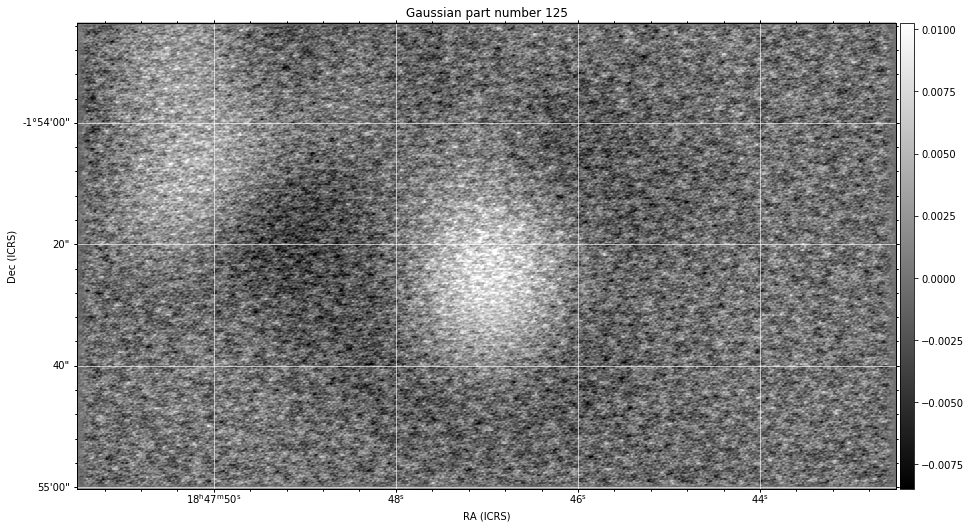

In [1082]:
fig_all = plt.figure(1, figsize=(15,15))
fig = aplpy.FITSFigure("/user/workdir/soldanof/data/gau.fits",figure=fig_all,slices=[nbr])
fig.show_colorscale(cmap='gray')
fig.add_colorbar()
fig.add_grid()
fig.set_title("Gaussian part number {}".format(nbr))

***
Trace Freq en fonction de Ra pour la partie gaussienne et la partie cohérente

INFO: Auto-setting vmin to -1.049e-02 [aplpy.core]
INFO: Auto-setting vmax to  1.382e-02 [aplpy.core]


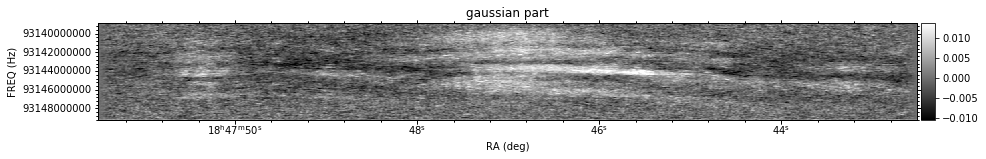

In [10]:
fig_all = plt.figure(1, figsize=(15,15))
fig = aplpy.FITSFigure("/user/workdir/soldanof/data/gau.fits",figure=fig_all,dimensions=[0,2],slices=[320])
fig.show_colorscale(cmap='gray')
fig.add_colorbar()
fig.set_title("gaussian part")

INFO: Auto-setting vmin to -1.317e-02 [aplpy.core]
INFO: Auto-setting vmax to  1.390e-02 [aplpy.core]


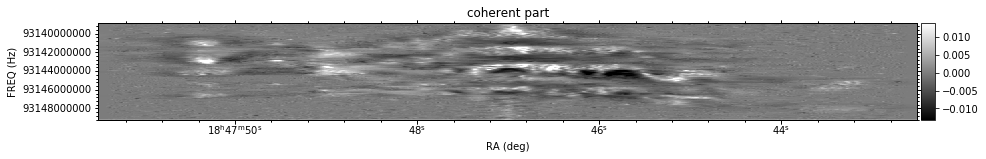

In [11]:
fig_all = plt.figure(1, figsize=(15,15))
fig = aplpy.FITSFigure("/user/workdir/soldanof/data/ng.fits",figure=fig_all,dimensions=[0,2],slices=[320])
fig.show_colorscale(cmap='gray')
fig.add_colorbar()
fig.set_title("coherent part")

***
# creation carte intégré (moment 0)

In [1399]:
im_ng.shape

(145, 698, 1226)

In [1400]:
im_ng_int = np.sum(im_ng,axis=0)

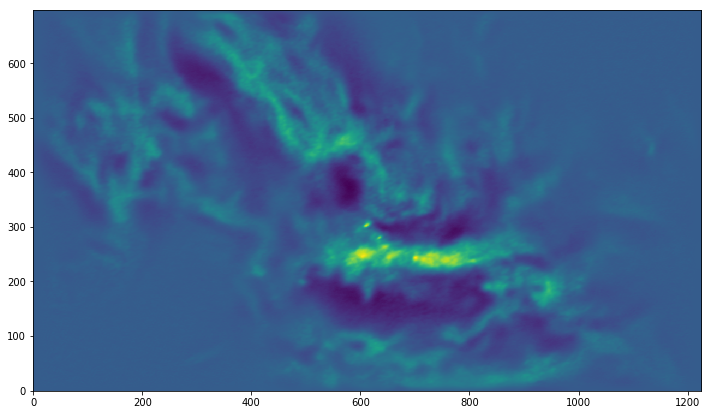

In [1401]:
imshow(im_ng_int.real,origin="lower")

In [1221]:
im_tot_int = np.sum(cube,axis=0)

Text(0.5, 1.0, 'moment 0 total')

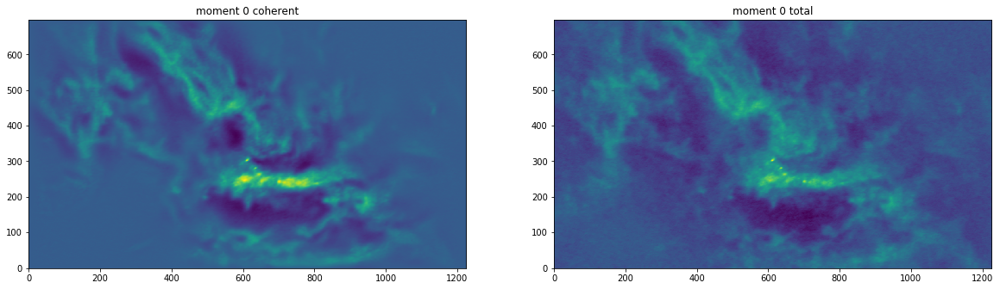

In [1402]:
figure(figsize=(20,10))

subplot(1,2,1)
imshow(im_ng_int.real,origin="lower")
title('moment 0 coherent')

subplot(1,2,2)
imshow(im_tot_int.real,origin="lower")
title('moment 0 total') 

Text(0.5, 1.0, 'moment 0 total')

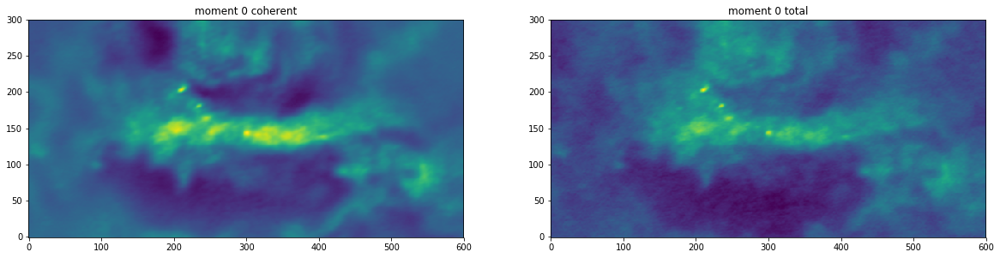

In [1141]:
figure(figsize=(20,10))

subplot(1,2,1)
imshow(im_ng_int.real[100:400,400:1000],origin="lower")
title('moment 0 coherent')

subplot(1,2,2)
imshow(im_tot_int.real[100:400,400:1000],origin="lower")
title('moment 0 total') 

In [1228]:
del header['NAXIS3']
del header['PC3_1']
del header['PC3_2']
del header['PC1_3']
del header['PC2_3']
del header['PC3_3']
del header['CTYPE3']
del header['CRVAL3']
del header['CDELT3']
del header['CRPIX3']
del header['CUNIT3']

In [1229]:
header['NAXIS']=2
fits.writeto("/user/workdir/soldanof/data/w43_n2hp/ng_t.fits",im_ng_int.real, header) 

***
# application MnGSeg sur carte moment 0 original 

In [1100]:
reso = header ['CDELT2']*60
M = nb_scale(cube.shape)
q = []
q= [2.0]*nb_scale(cube.shape)

wt, S11a, wave_k, S1a, q =  fan_trans(im_tot_int, reso=reso, angular=False,q=q,apodize = 0.98,arrdim = np.array([1024,1600]))

coherent = np.sum(wt[M:2*M,:,:],axis=0)
Gaussian = np.sum(wt[2*M:3*M,:,:],axis=0) 

  0%|          | 0/25 [00:00<?, ?it/s]

1600 1024


100%|██████████| 25/25 [02:49<00:00,  6.79s/it]


Text(0.5, 1.0, 'Coherent map canal moment 0 tot')

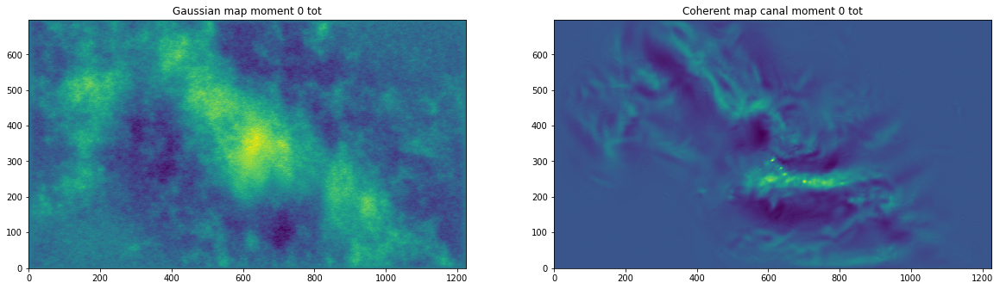

In [1101]:
figure(figsize=(20,10))

subplot(1,2,1)
imshow(Gaussian.real,origin="lower")
title('Gaussian map moment 0 tot')

subplot(1,2,2)
imshow(coherent.real,origin="lower")
title('Coherent map canal moment 0 tot')

Text(0.5, 1.0, 'moment 0 total')

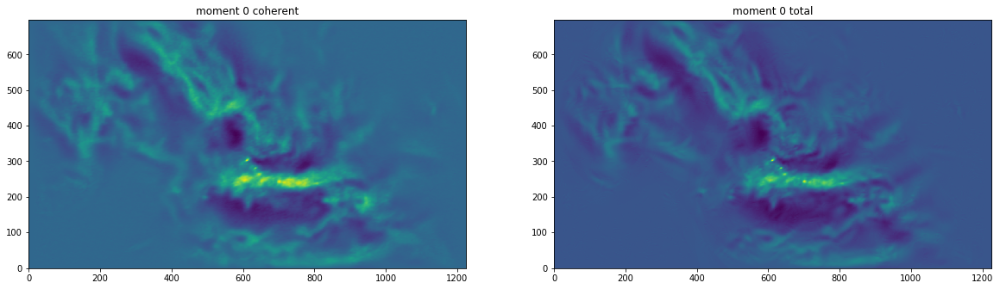

In [1102]:
figure(figsize=(20,10))

subplot(1,2,1)
imshow(im_ng_int.real,origin="lower")
title('moment 0 coherent')

subplot(1,2,2)
imshow(coherent.real,origin="lower")
title('moment 0 total') 

Text(0.5, 1.0, 'moment 0 total')

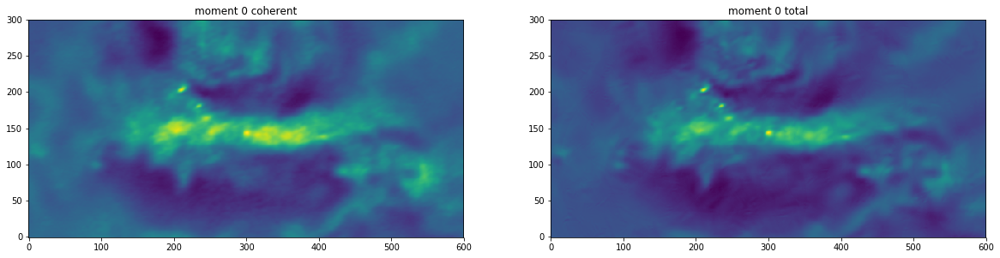

In [1103]:
figure(figsize=(20,10))

subplot(1,2,1)
imshow(im_ng_int.real[100:400,400:1000],origin="lower")
title('moment 0 coherent')

subplot(1,2,2)
imshow(coherent.real[100:400,400:1000],origin="lower")
title('moment 0 total') 

***
# calcul valeur moyenne de chaque canal

In [1509]:
filname = "/user/workdir/soldanof/ALMA/W43-MM1_B3_spw0_12M_n2hp.image_cut.fits"
HDU = fits.open(filname)
cube = HDU[0].data
header = HDU[0].header

In [1480]:
im_g = np.load("/user/workdir/soldanof/data/gau.npy")
im_ng = np.load("/user/workdir/soldanof/data/coh.npy")

In [1382]:
np.abs(cube[80,0:200,0:100]).max()

0.010525418445467949

In [1370]:
np.abs(cube[80,:,:]).mean()

0.004501319872735991

In [2]:
filname = "/user/workdir/soldanof/ALMA/W43-MM1_B3_spw0_12M_n2hp.image_cut.fits"
HDU = fits.open(filname)
cube = HDU[0].data
header = HDU[0].header
#im_g = np.load("/user/workdir/soldanof/data/gau.npy")
im_ng = np.load("/user/workdir/soldanof/data/coh.npy")
N = header['NAXIS3']

for i in range(N):
    cube[i,:,:] -= np.mean(cube[i,:,:])
    moy = (cube[i,:,:]).mean()
    im_ad = np.zeros((im_ng.shape[1],im_ng.shape[2]))
    im_ng_2d = im_ng[i,:,:]
    im_ad[np.abs(im_ng_2d)>=np.abs(cube[i,5:70,5:100]).mean()] = moy
    im_ng[i,:,:] = im_ng[i,:,:] + im_ad
    
    im_rmv = np.zeros((im_ng.shape[1],im_ng.shape[2]))
    im_ng_2d = im_ng[i,:,:]
    im_rmv[(im_ng_2d)<=np.abs(cube[i,:,:]).mean()] = np.nan
    im_ng[i,:,:] = im_ng[i,:,:] + im_rmv
    #im_g[i,:,:] = im_g[i,:,:]+moy

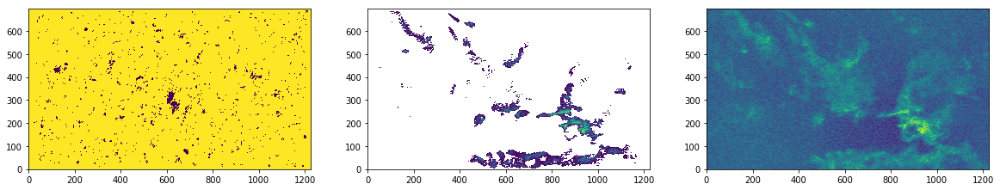

In [3]:
figure(figsize=(20,20))
subplot(131)
imshow(im_ad.real,origin="lower")

subplot(132)
imshow(im_ng[60].real,origin="lower")

subplot(133)
imshow(cube[60].real,origin="lower")

In [1570]:
fits.writeto("/user/workdir/soldanof/data/ng_mean.fits",im_ng.real, header,overwrite= True) 

In [1389]:
fits.writeto("/user/workdir/soldanof/data/g_mean.fits",im_g.real, header,overwrite= True) 

## supression valeur negative

In [1529]:
im_ng[im_ng<0]=np.NaN

In [1553]:
fits.writeto("/user/homedir/soldanof/ng_w43_mean_pos.fits",im_ng.real, header,overwrite= True) 

***
# carte moment 1 avec spectralcube
représentation des 4 premier coeur

In [1446]:
filname = "/user/workdir/soldanof/data/w43_n2hp/moment1.fits"
HDU = fits.open(filname)
moment1 = HDU[0].data
header_mom1 = HDU[0].header

INFO: Auto-setting vmin to -6.055e-01 [aplpy.core]
INFO: Auto-setting vmax to  1.032e+00 [aplpy.core]
INFO: Auto-setting vmin to  8.684e+01 [aplpy.core]
INFO: Auto-setting vmax to  1.048e+02 [aplpy.core]


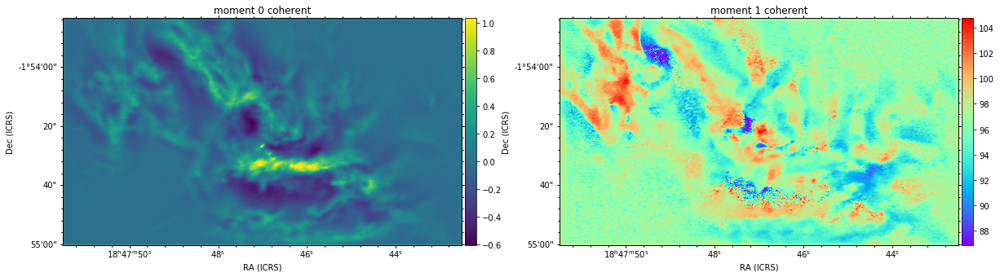

In [1315]:
fig_vel = plt.figure(6,figsize=(20,10))
f = aplpy.FITSFigure("/user/workdir/soldanof/data/w43_n2hp/ng_t.fits",figure=fig_vel,subplot=(1,2,1))  
f.show_colorscale()
f.add_colorbar()
f.set_title("moment 0 coherent")

f = aplpy.FITSFigure("/user/workdir/soldanof/data/w43_n2hp/moment1.fits",figure=fig_vel,subplot=(1,2,2))  
f.show_colorscale(cmap='rainbow')
f.add_colorbar()
f.set_title("moment 1 coherent")

INFO: Auto-setting vmin to  9.128e+01 [aplpy.core]
INFO: Auto-setting vmax to  9.975e+01 [aplpy.core]
INFO: Auto-setting vmin to  8.690e+01 [aplpy.core]
INFO: Auto-setting vmax to  1.043e+02 [aplpy.core]


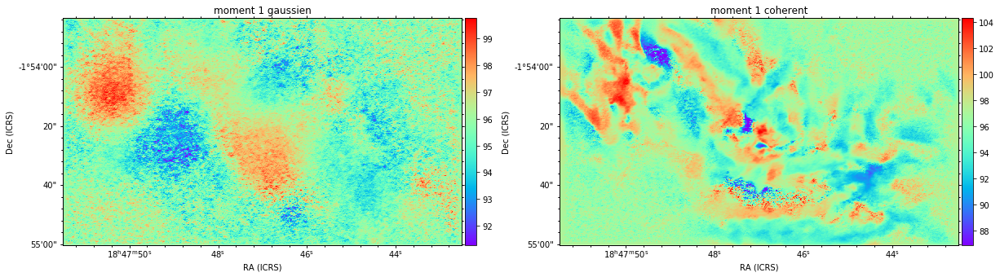

In [1394]:
fig_vel = plt.figure(6,figsize=(20,10))
f = aplpy.FITSFigure("/user/workdir/soldanof/data/w43_n2hp/moment1_g_pos.fits",figure=fig_vel,subplot=(1,2,1))  
f.show_colorscale(cmap='rainbow')
f.add_colorbar()
f.set_title("moment 1 gaussien")

f = aplpy.FITSFigure("/user/workdir/soldanof/data/w43_n2hp/moment1.fits",figure=fig_vel,subplot=(1,2,2))  
f.show_colorscale(cmap='rainbow')
f.add_colorbar()
f.set_title("moment 1 coherent")

***
carte moment 1 flitré :
- im_ad[np.abs(im_ng_2d)>=np.abs(cube[i,5:200,5:100]).mean()] = moy
- im_rmv[(im_ng_2d)<np.abs(cube[i,5:100,5:100]).mean()] = np.nan
- selection de la raie isolée (9.31476e+10Hz,9.3145e+10Hz)

INFO: Auto-setting vmin to  8.313e+01 [aplpy.core]
INFO: Auto-setting vmax to  9.315e+01 [aplpy.core]


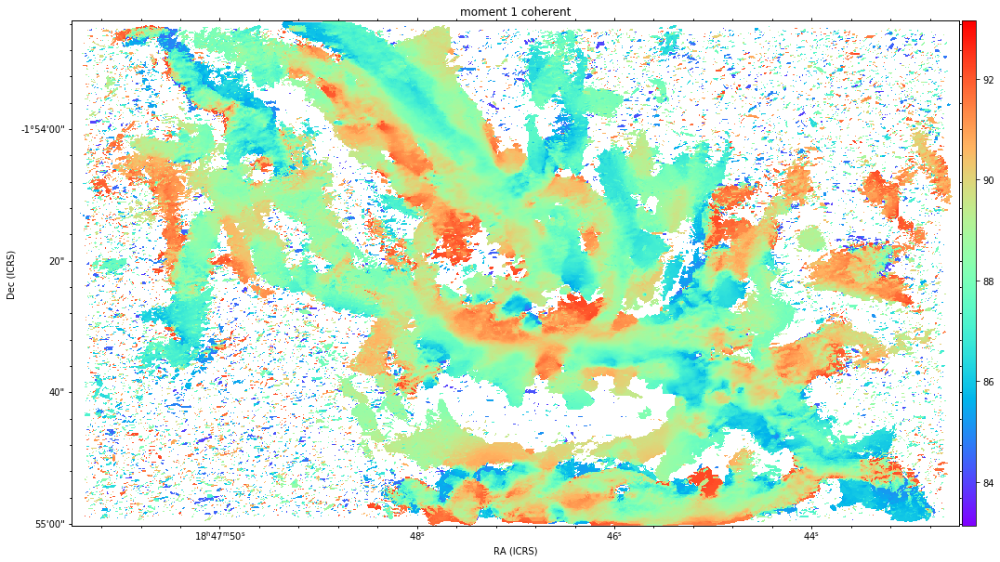

In [1555]:
fig_vel = plt.figure(6,figsize=(20,10))
f = aplpy.FITSFigure("/user/workdir/soldanof/data/w43_n2hp/moment1_w43_isolated_ng_filtred.fits",figure=fig_vel)  
f.show_colorscale(cmap='rainbow')
f.add_colorbar()
f.set_title("moment 1 coherent")

***
# Coupe PV avec pvextractor

In [5]:
from pvextractor import Path
from pvextractor import extract_pv_slice
from astropy import wcs
from astropy import units as u
from astropy.coordinates import SkyCoord
from astropy.coordinates import Galactic

In [6]:
filname = "/user/workdir/soldanof/data/ng.fits"
HDU = fits.open(filname)
cube = HDU[0].data
header = HDU[0].header

In [7]:
w = wcs.WCS(header)

if w.wcs.has_crota() == True:
    del header['CROTA1']
    del header['CROTA2']


w = wcs.WCS(header)

## Représentation des 4 premier coeur

In [8]:
c1 = SkyCoord('18:47:47.02 -1:54:26.86', unit=(u.hourangle, u.deg))
sky1 = w.world_to_pixel(c1,9.31491784e+10*u.Hz)[0:2]

c2 = SkyCoord('18:47:46.84 -1:54:29.30', unit=(u.hourangle, u.deg))
sky2 = w.world_to_pixel(c2,9.31491784e+10*u.Hz)[0:2]

c3 = SkyCoord('18:47:46.37 -1:54:33.41', unit=(u.hourangle, u.deg))
sky3 = w.world_to_pixel(c3,9.31491784e+10*u.Hz)[0:2]

c4 = SkyCoord('18:47:46.98 -1:54:26.42', unit=(u.hourangle, u.deg))
sky4 = w.world_to_pixel(c4,9.31491784e+10*u.Hz)[0:2]

In [9]:
sky3

[array(698.86099353), array(243.63563081)]

In [565]:
int(sky2[0])

634

Text(0.5, 1.0, 'moment 0 coherent')

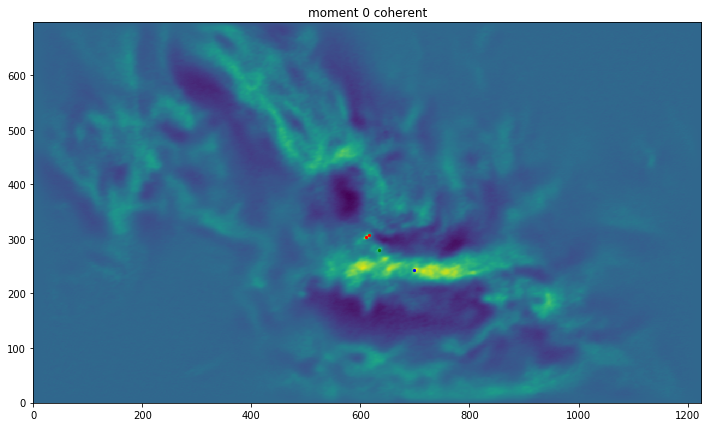

In [587]:
imshow(im_ng_int.real,origin="lower")
plt.scatter(int(sky4[0]), int(sky4[1]), s=5, c='r', marker='o')
plt.scatter(int(sky3[0]), int(sky3[1]), s=5, c='b', marker='o')
plt.scatter(int(sky2[0]), int(sky2[1]), s=5, c='g', marker='o')
plt.scatter(int(sky1[0]), int(sky1[1]), s=5, c='r', marker='o')
title('moment 0 coherent')

## Coupe diagonale du coeur 2

In [862]:
filname = "/user/workdir/soldanof/data/ng.fits"
HDU = fits.open(filname)
data = HDU[0].data
header = HDU[0].header
w = wcs.WCS(header)

if w.wcs.has_crota() == True:
	del header['CROTA1']
	del header['CROTA2']
	del header['CROTA3']

w = wcs.WCS(header)

#Slice extraction
#------------------------------------
#slice = np.array([[30.8168747,-7.8],[-0.056672928,17.8]])


p2 = SkyCoord('18:47:46.941 -1:54:30.41', unit=(u.hourangle, u.deg))

p3 = SkyCoord('18:47:46.741 -1:54:28.19', unit=(u.hourangle, u.deg))

skyp2 = w.world_to_pixel(p2,9.31491784e+10*u.Hz)[0:2]
skyp3 = w.world_to_pixel(p3,9.31491784e+10*u.Hz)[0:2]
x1= int(skyp2[0])
y1= int(skyp2[1])
x2 =int(skyp3[0])
y2=int(skyp3[1])

g = [(x1,y1),(x2,y2)]
width = 5

path = Path(g, width=width)
pv_diag = extract_pv_slice(data[5:140,:,:], path, wcs=w)

In [863]:
filname2 = "/user/workdir/soldanof/ALMA/W43-MM1_B3_spw0_12M_n2hp.image_cut.fits"
HDU = fits.open(filname2)
data = HDU[0].data
header = HDU[0].header
w = wcs.WCS(header)

if w.wcs.has_crota() == True:
	del header['CROTA1']
	del header['CROTA2']
	del header['CROTA3']

w = wcs.WCS(header)


path = Path(g, width=width)

pv_diag_t = extract_pv_slice(data, path, wcs=w)

INFO: Auto-setting vmin to -1.773e-02 [aplpy.core]
INFO: Auto-setting vmax to  2.706e-02 [aplpy.core]
INFO: Auto-setting vmin to -1.394e-02 [aplpy.core]
INFO: Auto-setting vmax to  3.527e-02 [aplpy.core]


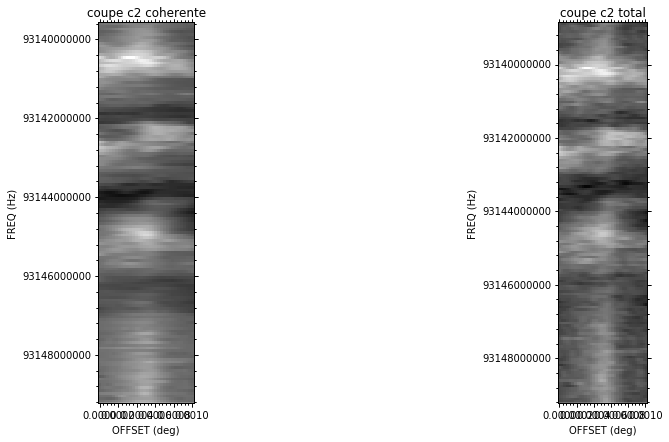

In [864]:
fig_vel = plt.figure(6)
f3 = aplpy.FITSFigure(pv_diag,figure=fig_vel,subplot=(1,2,1))
f3.show_grayscale(stretch='linear')
f3.set_title("coupe c2 coherente")

fig_vel = plt.figure(6)
f3 = aplpy.FITSFigure(pv_diag_t,figure=fig_vel,subplot=(1,2,2))
f3.show_grayscale(stretch='linear')
f3.set_title("coupe c2 total")

Text(0.5, 1.0, 'moment 0 coherent')

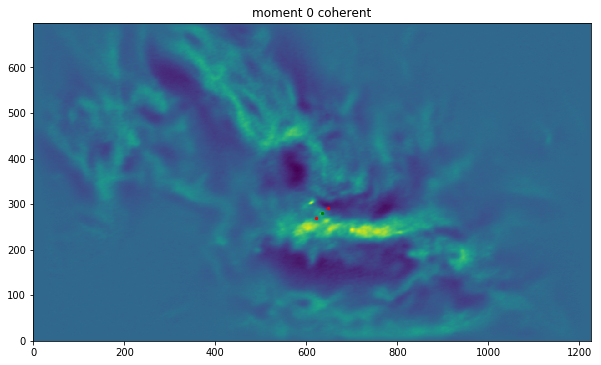

In [865]:
figure(figsize=(10,10))
imshow(im_ng_int.real,origin="lower")
skyp2 = w.world_to_pixel(p2,9.31491784e+10*u.Hz)[0:2]
skyp3 = w.world_to_pixel(p3,9.31491784e+10*u.Hz)[0:2]

plt.scatter(int(skyp2[0]), int(skyp2[1]), s=5, c='r', marker='o')
plt.scatter(int(skyp3[0]), int(skyp3[1]), s=5, c='r', marker='o')
plt.scatter(int(sky2[0]), int(sky2[1]), s=5, c='g', marker='o')

title('moment 0 coherent')

***



INFO: Auto-setting vmin to -1.650e-02 [aplpy.core]
INFO: Auto-setting vmax to  3.401e-02 [aplpy.core]
INFO: Auto-setting vmin to -1.265e-02 [aplpy.core]
INFO: Auto-setting vmax to  4.114e-02 [aplpy.core]


<Figure size 720x1080 with 0 Axes>

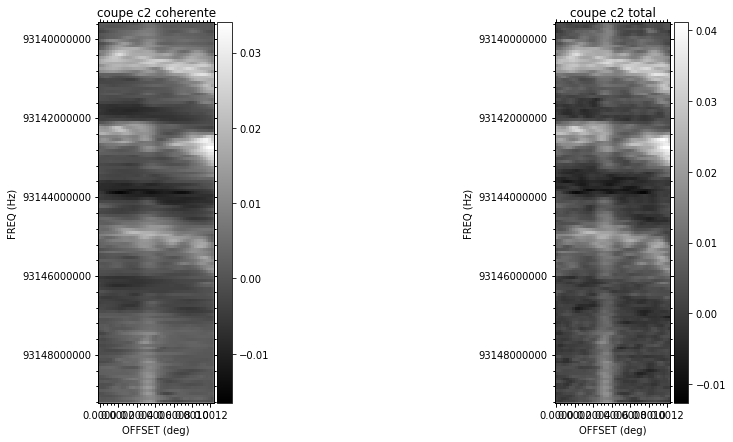

In [1175]:
filname = "/user/workdir/soldanof/data/ng_mean.fits"
HDU = fits.open(filname)
data = HDU[0].data
header = HDU[0].header
w = wcs.WCS(header)

if w.wcs.has_crota() == True:
	del header['CROTA1']
	del header['CROTA2']
	del header['CROTA3']

w = wcs.WCS(header)

#Slice extraction

p2 = SkyCoord('18:47:46.921 -1:54:27.76', unit=(u.hourangle, u.deg))

p3 = SkyCoord('18:47:46.708 -1:54:31.16', unit=(u.hourangle, u.deg))

skyp2 = w.world_to_pixel(p2,9.31491784e+10*u.Hz)[0:2]
skyp3 = w.world_to_pixel(p3,9.31491784e+10*u.Hz)[0:2]
x1= int(skyp2[0])
y1= int(skyp2[1])
x2 =int(skyp3[0])
y2=int(skyp3[1])

g = [(x1,y1),(x2,y2)]
width = 5


path = Path(g, width=width)
pv_diag = extract_pv_slice(data[5:140,:,:], path, wcs=w)

#-----------------------------------------

filname2 = "/user/workdir/soldanof/ALMA/W43-MM1_B3_spw0_12M_n2hp.image_cut.fits"
HDU = fits.open(filname2)
data = HDU[0].data
header = HDU[0].header
w = wcs.WCS(header)

if w.wcs.has_crota() == True:
	del header['CROTA1']
	del header['CROTA2']
	del header['CROTA3']

w = wcs.WCS(header)

path = Path(g,width=width)
pv_diag_tot = extract_pv_slice(data[5:140,:,:], path, wcs=w)

#-----------------------------------

figure(figsize=(10,15))
fig_vel = plt.figure(6)
f3 = aplpy.FITSFigure(pv_diag,figure=fig_vel,subplot=(1,2,1))
f3.show_grayscale(stretch='linear')
f3.set_title("coupe c2 coherente")
f3.add_colorbar()

fig_vel = plt.figure(6)
f3 = aplpy.FITSFigure(pv_diag_tot,figure=fig_vel,subplot=(1,2,2))
f3.show_grayscale(stretch='linear')
f3.set_title("coupe c2 total")
f3.add_colorbar()

Text(0.5, 1.0, 'moment 0 coherent')

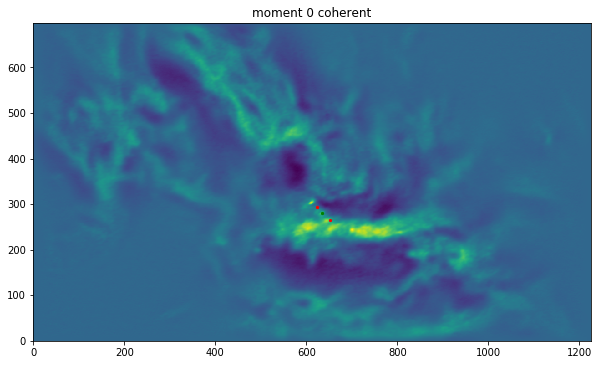

In [1176]:
figure(figsize=(10,10))
imshow(im_ng_int.real,origin="lower")
skyp2 = w.world_to_pixel(p2,9.31491784e+10*u.Hz)[0:2]
skyp3 = w.world_to_pixel(p3,9.31491784e+10*u.Hz)[0:2]

plt.scatter(int(skyp2[0]), int(skyp2[1]), s=5, c='r', marker='o')
plt.scatter(int(skyp3[0]), int(skyp3[1]), s=5, c='r', marker='o')
plt.scatter(int(sky2[0]), int(sky2[1]), s=5, c='g', marker='o')

title('moment 0 coherent')

***
# Coupe du grand filament


INFO: Auto-setting vmin to -1.178e-02 [aplpy.core]
INFO: Auto-setting vmax to  3.675e-02 [aplpy.core]


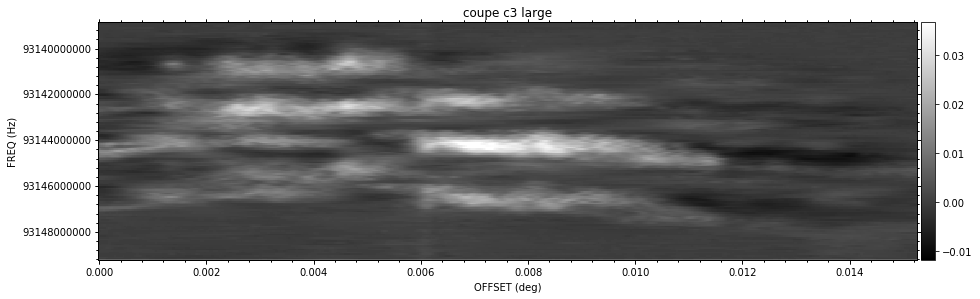

In [922]:
filname = "/user/workdir/soldanof/data/ng.fits"
HDU = fits.open(filname)
data = HDU[0].data
header = HDU[0].header
w = wcs.WCS(header)

if w.wcs.has_crota() == True:
	del header['CROTA1']
	del header['CROTA2']
	del header['CROTA3']

w = wcs.WCS(header)

#Slice extraction

p2 = SkyCoord('18:47:46.921 -1:54:27.76', unit=(u.hourangle, u.deg))

p3 = SkyCoord('18:47:46.708 -1:54:31.16', unit=(u.hourangle, u.deg))

#Slice extraction
#------------------------------------
#skyp2 = w.world_to_pixel(p2,9.31491784e+10*u.Hz)[0:2]
#skyp3 = w.world_to_pixel(p3,9.31491784e+10*u.Hz)[0:2]

y1= int(243)
x1= int(500)
y2 =int(243)
x2=int(1000)

g = [(x1,y1),(x2,y2)]

width = 25

path = Path(g,width)
pv_diag_tot = extract_pv_slice(data, path, wcs=w)


fig_vel = plt.figure(6)
f3 = aplpy.FITSFigure(pv_diag_tot,figure=fig_vel)
f3.show_colorscale(cmap='gray')
f3.set_title("coupe c3 large")
f3.add_colorbar()

Text(0.5, 1.0, 'moment 0 coherent')

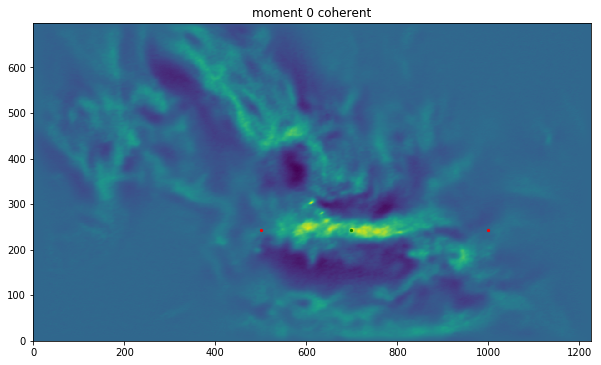

In [875]:
figure(figsize=(10,10))
imshow(im_ng_int.real,origin="lower")
skyp2 = w.world_to_pixel(p2,9.31491784e+10*u.Hz)[0:2]
skyp3 = w.world_to_pixel(p3,9.31491784e+10*u.Hz)[0:2]

plt.scatter(500, 243, s=5, c='r', marker='o')
plt.scatter(1000, 243, s=5, c='r', marker='o')
plt.scatter(int(sky3[0]), int(sky3[1]), s=5, c='g', marker='o')

title('moment 0 coherent')

***
## coupe grand filament Nord

In [1215]:
filname = "/user/workdir/soldanof/data/ng.fits"
HDU = fits.open(filname)
data = HDU[0].data
header = HDU[0].header
w = wcs.WCS(header)

if w.wcs.has_crota() == True:
	del header['CROTA1']
	del header['CROTA2']
	del header['CROTA3']

w = wcs.WCS(header)

#Slice extraction

p1 = SkyCoord('18:47:49.158 -1:53:48.341', unit=(u.hourangle, u.deg))

p2 = SkyCoord('18:47:47.155 -1:54:26.36', unit=(u.hourangle, u.deg))

skyp1 = w.world_to_pixel(p1,9.31491784e+10*u.Hz)[0:2]
skyp2 = w.world_to_pixel(p2,9.31491784e+10*u.Hz)[0:2]
x1= int(skyp1[0])
y1= int(skyp1[1])
x2 =int(skyp2[0])
y2=int(skyp2[1])

pt = [(x1,y1),(x2,y2)]
width = 25


path = Path(pt, width=width)
pv_diag = extract_pv_slice(data, path, wcs=w)

INFO: Auto-setting vmin to -1.556e-02 [aplpy.core]
INFO: Auto-setting vmax to  1.923e-02 [aplpy.core]


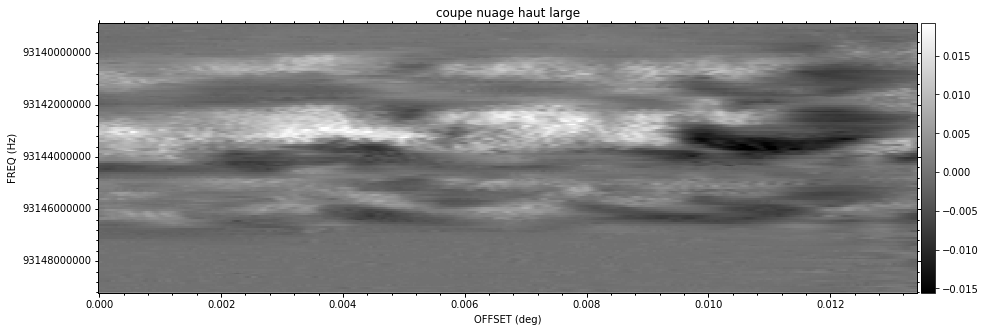

In [1216]:
fig_vel = plt.figure(6)
f3 = aplpy.FITSFigure(pv_diag,figure=fig_vel)
f3.show_colorscale(cmap='gray')
f3.set_title("coupe nuage haut large")
f3.add_colorbar()

Text(0.5, 1.0, 'moment 0 coherent')

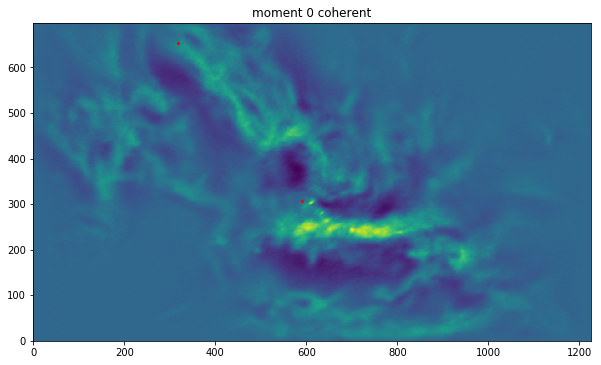

In [1231]:
figure(figsize=(10,10))
imshow(im_ng_int.real,origin="lower")

plt.scatter(x1, y1, s=5, c='r', marker='o')
plt.scatter(x2, y2, s=5, c='r', marker='o')

title('moment 0 coherent')

***
### coupe grand filament 2

In [1327]:
filname = "/user/workdir/soldanof/data/ng_mean.fits"
HDU = fits.open(filname)
data = HDU[0].data
header = HDU[0].header
w = wcs.WCS(header)

if w.wcs.has_crota() == True:
	del header['CROTA1']
	del header['CROTA2']
	del header['CROTA3']

w = wcs.WCS(header)

#Slice extraction

p1 = SkyCoord('18:47:49.024 -1:53:50.34', unit=(u.hourangle, u.deg))
p2 = SkyCoord('18:47:47.746 -1:54:12.72', unit=(u.hourangle, u.deg))
p3 = SkyCoord('18:47:47.155 -1:54:09.02', unit=(u.hourangle, u.deg))
p4 = SkyCoord('18:47:46.105 -1:54:28.41', unit=(u.hourangle, u.deg))

skyp1 = w.world_to_pixel(p1,9.31491784e+10*u.Hz)[0:2]
skyp2 = w.world_to_pixel(p2,9.31491784e+10*u.Hz)[0:2]
x1= int(skyp1[0])
y1= int(skyp1[1])
x2 =int(skyp2[0])
y2=int(skyp2[1])

skyp3 = w.world_to_pixel(p3,9.31491784e+10*u.Hz)[0:2]
x3= int(skyp3[0])
y3= int(skyp3[1])

skyp4 = w.world_to_pixel(p4,9.31491784e+10*u.Hz)[0:2]
x4= int(skyp4[0])
y4= int(skyp4[1])

pt = [(x1,y1),(x2,y2),(x3,y3),(x4,y4)]
width = 20


path = Path(pt, width=width)
pv_diag = extract_pv_slice(data, path, wcs=w)

INFO: Auto-setting vmin to -9.086e-03 [aplpy.core]
INFO: Auto-setting vmax to  2.452e-02 [aplpy.core]


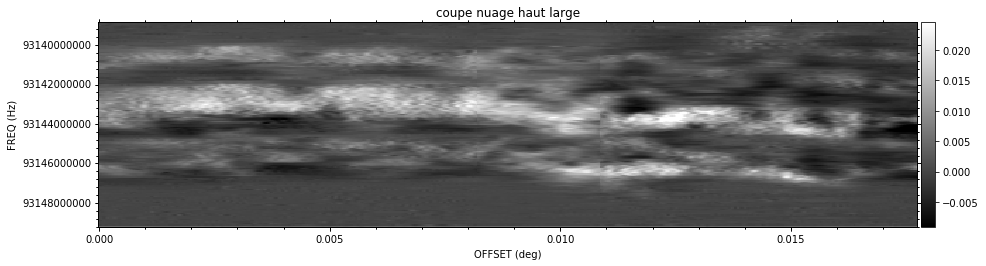

In [1328]:
fig_vel = plt.figure(6)
f3 = aplpy.FITSFigure(pv_diag,figure=fig_vel)
f3.show_colorscale(cmap='gray')
f3.set_title("coupe nuage haut large")
f3.add_colorbar()

Text(0.5, 1.0, 'moment 1 coherent')

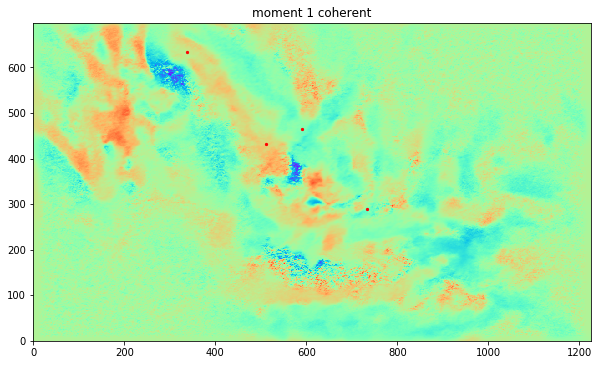

In [1447]:
figure(figsize=(10,10))
imshow(moment1,origin="lower",cmap='rainbow')

plt.scatter(x1, y1, s=5, c='r', marker='o')
plt.scatter(x2, y2, s=5, c='r', marker='o')
plt.scatter(x3, y3, s=5, c='r', marker='o')
plt.scatter(x4, y4, s=5, c='r', marker='o')

title('moment 1 coherent')

***
## coupe transverse au grand filament Nord

In [1490]:
filname = "/user/workdir/soldanof/data/ng.fits"
HDU = fits.open(filname)
data = HDU[0].data
header = HDU[0].header
w = wcs.WCS(header)

if w.wcs.has_crota() == True:
	del header['CROTA1']
	del header['CROTA2']
	del header['CROTA3']

w = wcs.WCS(header)

#Slice extraction

p1 = SkyCoord('18:47:48.787 -1:54:12.215', unit=(u.hourangle, u.deg))
skyp1 = w.world_to_pixel(p1,9.31491784e+10*u.Hz)[0:2]
x1= int(skyp1[0])
y1= int(skyp1[1])

p2 = SkyCoord('18:47:46.379 -1:53:50.090', unit=(u.hourangle, u.deg))
skyp2 = w.world_to_pixel(p2,9.31491784e+10*u.Hz)[0:2]
x2= int(skyp2[0])
y2= int(skyp2[1])

pt = [(x1,y1),(x2,y2)]
width = 5

path = Path(pt, width=width)
pv_diag = extract_pv_slice(data, path, wcs=w)

INFO: Auto-setting vmin to -1.530e-02 [aplpy.core]
INFO: Auto-setting vmax to  1.955e-02 [aplpy.core]


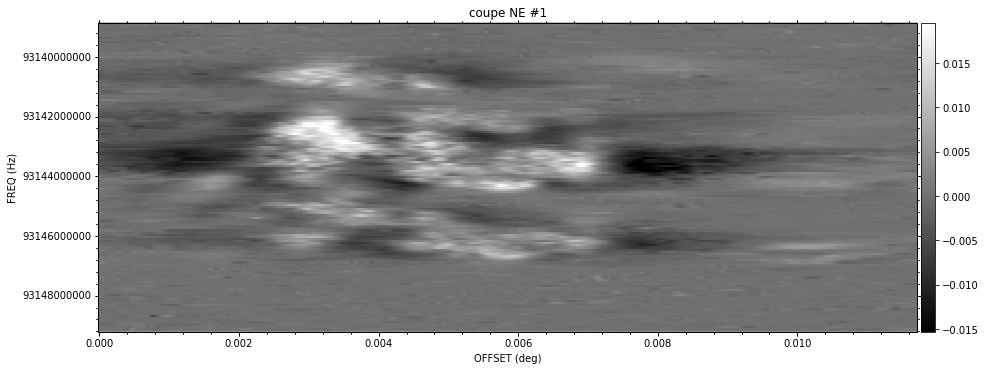

In [1491]:
fig_vel = plt.figure(6)
f3 = aplpy.FITSFigure(pv_diag,figure=fig_vel)
f3.show_colorscale(cmap='gray')
f3.set_title("coupe NE #1")
f3.add_colorbar()

Text(0.5, 1.0, 'moment 0 coherent')

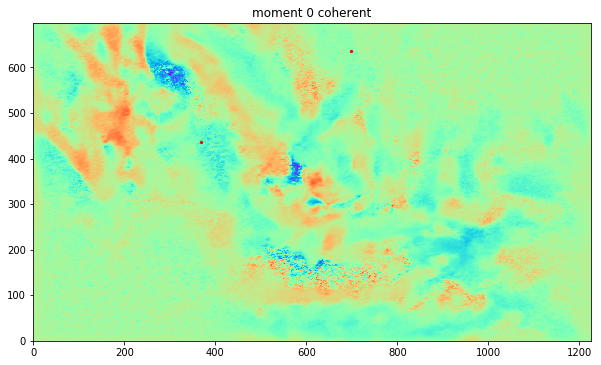

In [1492]:
figure(figsize=(10,10))
imshow(moment1,origin="lower",cmap='rainbow')

plt.scatter(x1, y1, s=5, c='r', marker='o')
plt.scatter(x2, y2, s=5, c='r', marker='o')

title('moment 0 coherent')

***
# Traitement des donnée du spectre de puissance

In [1268]:
t = np.load("/user/workdir/soldanof/data/s1at.npy")
g = np.load("/user/workdir/soldanof/data/s1ag.npy")
ng = np.load("/user/workdir/soldanof/data/s1ang.npy")
w_k = np.load("/user/workdir/soldanof/data/wave_k.npy")

Fonction de trace du spectre de puissance

In [1410]:
def affiche(n) :
    plt.plot(w_k, t[n],label="total")
    plt.plot(w_k, g[n],"o",label="gaussian")
    plt.plot(w_k, ng[n],"x",label="non gaussian")
    plt.xscale("log")
    plt.yscale("log")
    plt.ylabel('P(k)')
    plt.xlabel('k (arcmin$^{-1}$)')
    plt.title('canal number {}'.format(n))
    plt.legend()

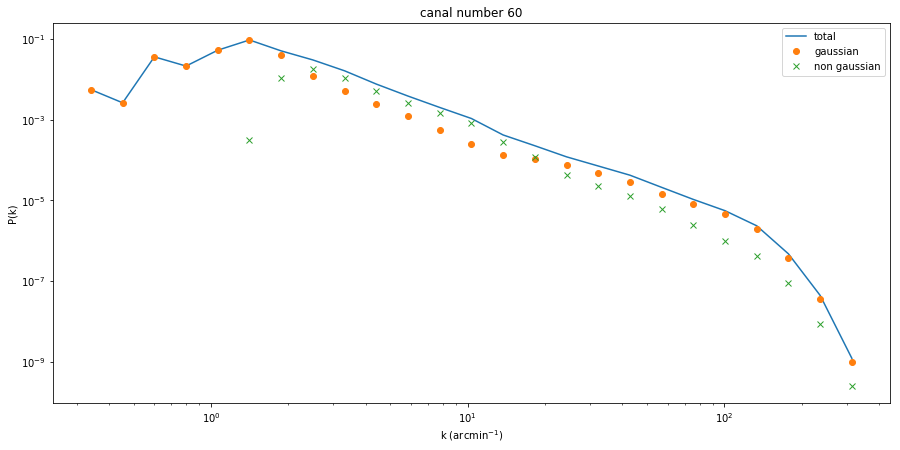

In [1412]:
affiche(60)

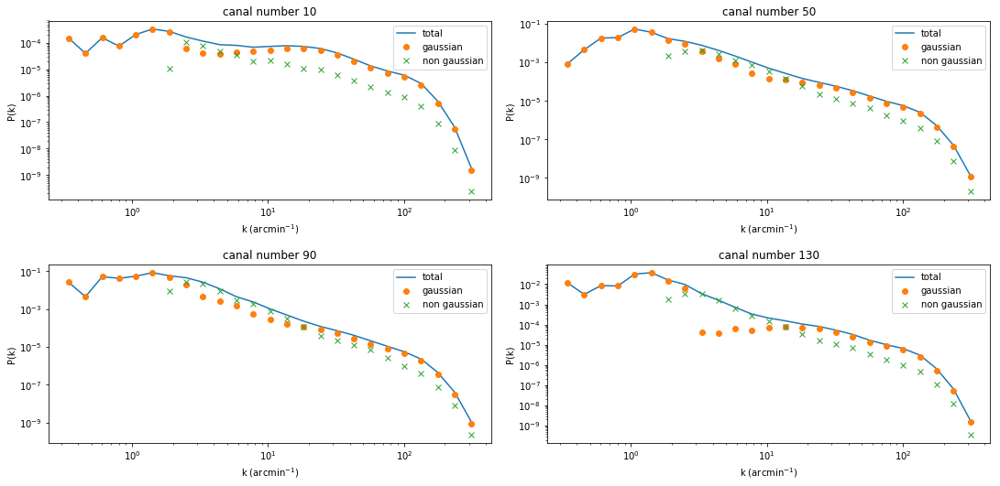

In [1437]:

fig, axes = plt.subplots(nrows=2, ncols=2)
fig.tight_layout(w_pad =3, h_pad = 5)

subplot(2,2,1)
affiche(10)

subplot(2,2,2)
affiche(50)

subplot(2,2,3)
affiche(90)

subplot(2,2,4)
affiche(130)

***
Test d'annimation des données

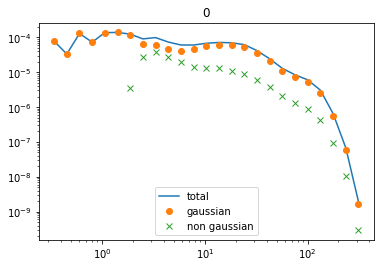

<function __main__.affiche(n)>

In [34]:
val = interact(affiche, n=IntSlider(min=0, max=144, step = 1))
display(val)

***
# Fit des spectres de puissances avant corection du beam

In [86]:
def f1(x,a,b):
    return b*(x**a)

In [84]:
def f(x,a,b):
    return a*x+b

In [123]:
nbr = 130
popt, pcov = curve_fit(f, np.log(w_k[7:-4]), np.log(g[nbr][7:-4]))
print(popt)

[-0.9771522  -7.21953785]


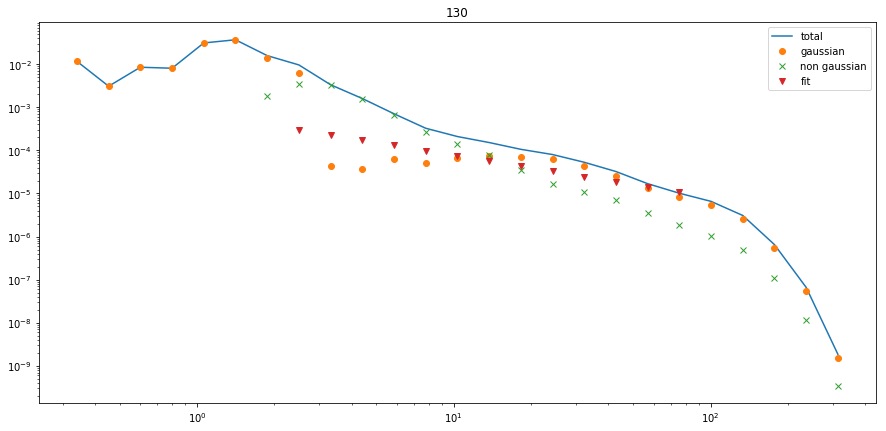

In [124]:
affiche(nbr)
plt.plot(w_k[7:-5],f1(w_k,popt[0],np.exp(popt[1]))[7:-5],"v",label="fit")
legend()

In [104]:
puiss_t = []
puiss_g = []
puiss_ng = []

N = header['NAXIS3']
for i in range(N) :
    popt, pcov = curve_fit(f, np.log(w_k[7:-4]), np.log(t[i][7:-4]))
    puiss_t.append(popt[0])
    
    popt, pcov = curve_fit(f, np.log(w_k[7:-4]), np.log(g[i][7:-4]))
    puiss_g.append(popt[0])
    
    popt, pcov = curve_fit(f, np.log(w_k[7:-4]), np.log(ng[i][7:-4]))
    puiss_ng.append(popt[0])

In [ ]:
figure(figsize(15,7))
plot(puiss_t,label="total")
plot(puiss_ng,label="non gaussien")
plot(puiss_g,label="gaussien")
legend()
grid()

***
# Corection du beam du télescope

In [126]:
from pywavan import apodize, padding, gauss_beam

In [1277]:
#Resolution in arcmin
reso = header['CDELT2'] * 60.

im = cube[50]
#im = im_g[50]

#Apodization
imzm = im - np.mean(im)
tapper = apodize(im.shape[0],im.shape[1],0.98)
imt = imzm *tapper
nsize = 1024
imr = padding(imt,1024,1600)


#Fourier Powre Spectrum
tab_k_im, spec_k_im = powspec(imr, reso = reso)

In [976]:
tab_k_im.shape

(798,)

In [753]:
reso = header['CDELT2'] * 60.

In [1255]:
#Noise evaluation
noise = np.mean(spec_k_im[(tab_k_im > 200.) & (tab_k_im < 300.)])

In [1256]:
noise

3.5487118284733424e-08

In [1452]:
#Beam Power spectrum
FWHM = 0.53 / (60*reso*np.sqrt(2*np.log(2)))  #Beam size

beam = gauss_beam(FWHM,1024,1600,FWHM=True)
tab_k_im, spec_beam = powspec(beam, reso=reso)
spec_beamn = spec_beam/spec_beam[0]  #Spectrum normalisation

In [1453]:
#Power spectrum fit
limites = np.where((tab_k_im >= tab_k_im[10]) & (tab_k_im < tab_k_im[100]))

A = np.polyfit(np.log(tab_k_im[limites]), np.log((spec_k_im[limites]-noise)/spec_beamn[limites]),deg=1)
fit_im = np.exp(A[1])*tab_k_im**A[0]
print('Pywavan fBm Power fit')
print('A, Gamma = ', np.exp(A[1]), A[0])

Pywavan fBm Power fit
A, Gamma =  0.05657830135248383 -1.907894549339928


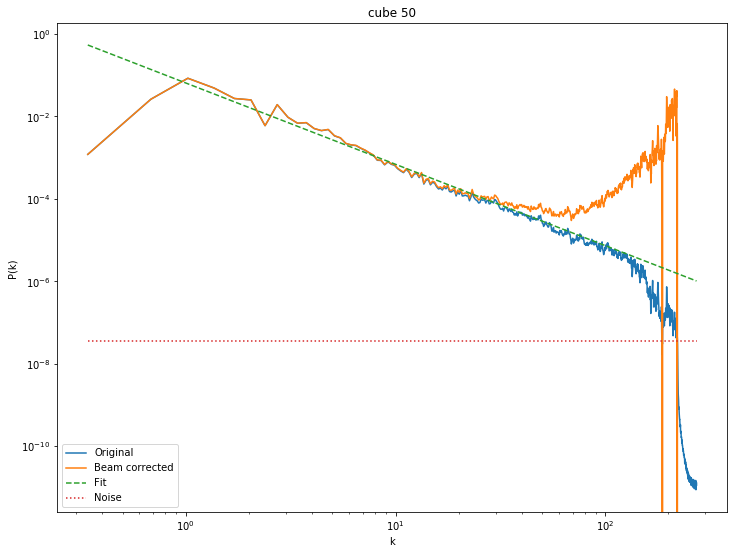

In [1264]:
figure(figsize=(12,9))
plot(tab_k_im, spec_k_im, label='Original')
plot(tab_k_im, (spec_k_im-noise)/spec_beamn, label='Beam corrected')
plot(tab_k_im, fit_im, linestyle='--', label='Fit')
plot([tab_k_im[0],tab_k_im[-1]], [noise,noise], linestyle=':', label='Noise')
xscale('log')
yscale('log')
xlabel('k')
ylabel('P(k)')
title('cube 50')
legend()

In [759]:
S1aB[5]

0.001313754527540774

In [1414]:
reso = header['CDELT2'] * 60.
FWHM = 0.53 / (60*reso)

beam = gauss_beam(FWHM,1024,1600,FWHM=True)
wtB, S11aB, wav_k, S1aB, qB = fan_trans(beam, reso=reso, q=0, angular=False)
del wtB, S11aB, qB

100%|██████████| 25/25 [01:14<00:00,  2.96s/it]


In [1284]:
#Normalisation
S1aBn = S1aB/S1aB[4]
S1aBn[:3] = 1.

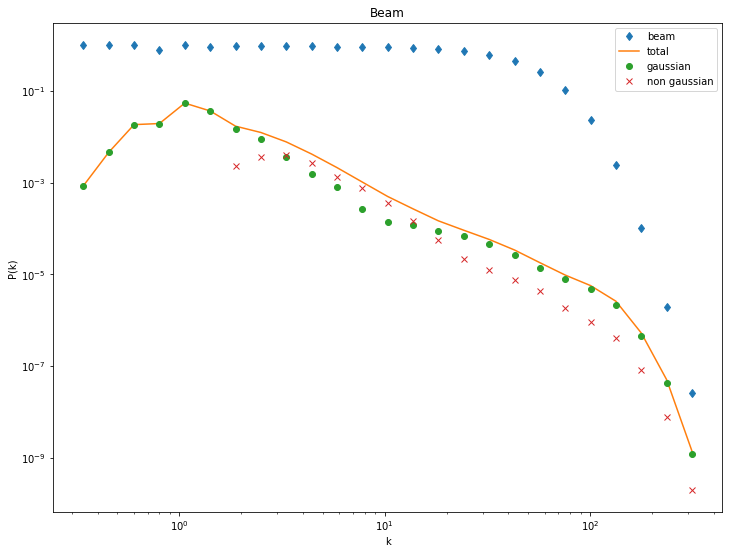

In [1285]:
figure(figsize=(12,9))
n=50
plot(wav_k,  S1aBn,'d', label='beam')
plt.plot(w_k, t[n],label="total")
plt.plot(w_k, g[n],"o",label="gaussian")
plt.plot(w_k, ng[n],"x",label="non gaussian")
plt.xscale("log")
plt.yscale("log")
xscale('log')
yscale('log')
xlabel('k')
ylabel('P(k)')
title('Beam')
legend()

100%|██████████| 25/25 [01:17<00:00,  3.09s/it]


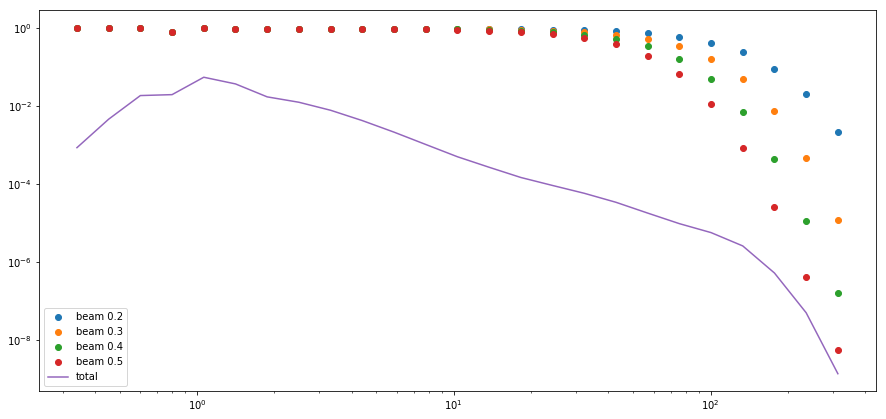

In [914]:
for i in range(2,6) :
    FWHM = i*0.1 / (60*reso)
    beam = gauss_beam(FWHM,1024,1600,FWHM=True)
    wtB, S11aB, wav_k, S1aB, qB = fan_trans(beam, reso=reso, q=0, angular=False)
    del wtB, S11aB, qB
    S1aBn = S1aB/S1aB[4]
    S1aBn[:3] = 1.
    plot(wav_k,  S1aBn,'o', label='beam 0.{}'.format(i))

plt.plot(w_k, t[n],label="total")
plt.xscale("log")
plt.yscale("log")
legend()

In [1286]:
#Power spectrum fit
num=50
Ag = np.polyfit(np.log(w_k[7:17]), np.log((t[num][7:17]-noise)/S1aBn[7:17]),deg=1)
fitG = np.exp(Ag[1])*wav_k**Ag[0]
print('Gaussian Power fit')
print('A, Gamma = ', np.exp(Ag[1]), Ag[0])

Gaussian Power fit
A, Gamma =  0.08539350607272918 -2.0628508340792653


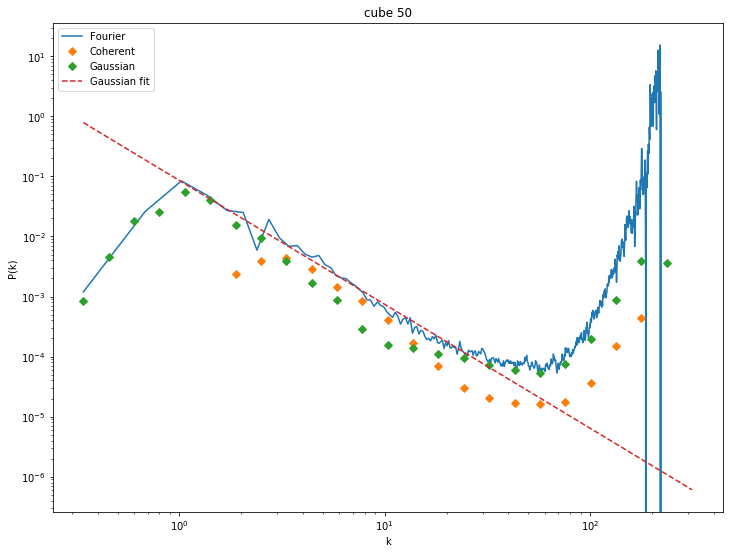

In [1287]:
figure(figsize=(12,9))
num=50
#plot(tab_k_im, spec_k_im, label='Fourier')
#plot(wav_k, S1a[1,:], 'D', label='Coherent')
#plot(wav_k, S1a[2,:], 'D', label='Gaussian')
plot(tab_k_im, (spec_k_im-noise)/spec_beamn, label='Fourier')
plot(wav_k, (ng[num]-noise)/S1aBn, 'D', label='Coherent')
plot(wav_k, (g[num]-noise)/S1aBn, 'D', label='Gaussian')
plot(wav_k, fitG, '--', label='Gaussian fit')
xscale('log')
yscale('log')
xlabel('k')
ylabel('P(k)')
title('cube 50')
legend()
#ylim(10**-10,1)

***
# Supression beam avec Turbustat

In [936]:
from turbustat.statistics import PowerSpectrum

In [927]:
from radio_beam import Beam

In [961]:
my_beam = Beam(0.53*u.arcsec)

                            OLS Regression Results                            
Dep. Variable:                      y   R-squared:                       0.958
Model:                            OLS   Adj. R-squared:                  0.957
Method:                 Least Squares   F-statistic:                     1315.
Date:                Thu, 01 Jul 2021   Prob (F-statistic):           3.71e-50
Time:                        11:00:22   Log-Likelihood:                 69.457
No. Observations:                  79   AIC:                            -134.9
Df Residuals:                      77   BIC:                            -130.2
Df Model:                           1                                         
Covariance Type:                  HC3                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const         -0.6239      0.081     -7.662      0.0

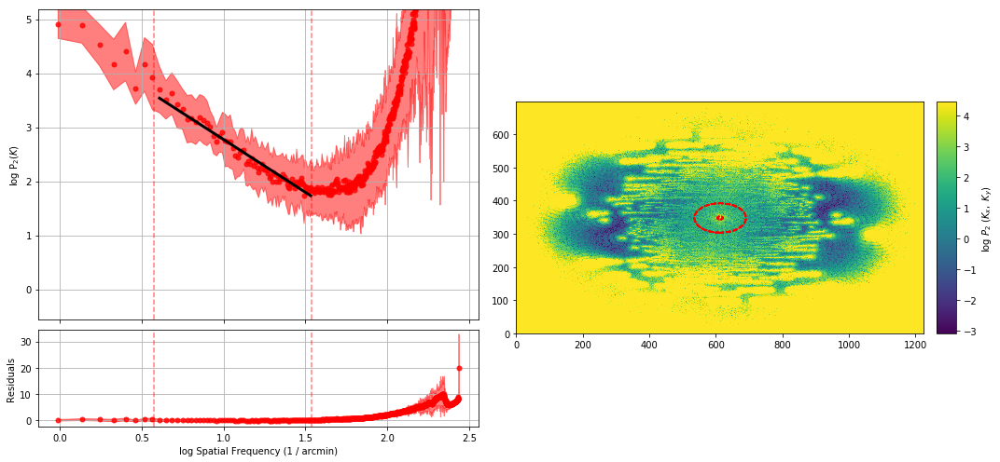

In [1302]:
#filname = "/user/workdir/soldanof/data/ng.fits"
filname = "/user/workdir/soldanof/ALMA/W43-MM1_B3_spw0_12M_n2hp.image_cut.fits"
HDU = fits.open(filname)
cube = HDU[0].data
header = HDU[0].header

my_beam = Beam(0.53*u.arcsec)
pspec = PowerSpectrum(cube[50], header=header,beam=my_beam)
pspec.run(verbose=True, beam_correct=True, fit_2D=False,use_wavenumber=False, xunit=u.arcmin**-1,low_cut=tab_k_im[10] / u.arcmin, high_cut=tab_k_im[100] / u.arcmin,apodize_kernel='tukey')

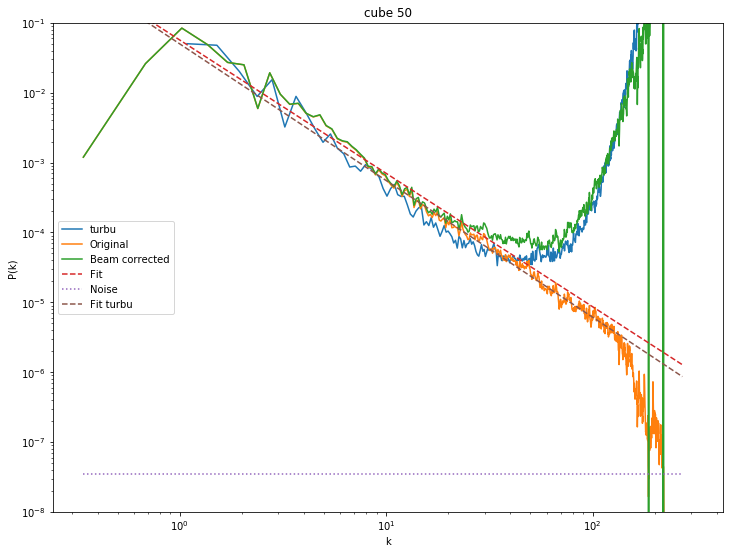

In [1458]:
figure(figsize=(12,9))
plot(pspec.wavenumbers/1.15,(pspec.ps1D)/(1024*1600), label = "turbu")
plot(tab_k_im, spec_k_im, label='Original')
plot(tab_k_im, (spec_k_im-noise)/spec_beamn ,label='Beam corrected')
plot(tab_k_im, fit_im, linestyle='--', label='Fit')
plot([tab_k_im[0],tab_k_im[-1]], [noise,noise], linestyle=':', label='Noise')
fit_turb = np.exp(-3)*tab_k_im**pspec.slope
plot(tab_k_im, fit_turb, linestyle='--', label='Fit turbu')
xscale('log')
yscale('log')
xlabel('k')
ylabel('P(k)')
ylim(10**-8,10**-1)
title('cube 50')
legend()

In [1298]:
pspec.slope-A[0]

-0.04715196400079824